# Feature Analysis: What Do the Models Learn?

This notebook inspects the features learned by the three trained PatchCraft variants:
- **`image_only`** — vanilla CNN on raw RGB (baseline)
- **`fingerprint_only`** — CNN on 30 SRM residual channels (the "filter network")
- **`hybrid`** — CNN on RGB + 30 SRM residuals concatenated

Sections:
1. Visualize the 30 hardcoded SRM kernels
2. Activation maps: SRM filters applied to real and fake sample images
3. Which SRM filters discriminate real vs. fake most strongly
4. Classifier first-layer attention (per mode)
5. Cross-mode attention comparison (`fingerprint_only` vs `hybrid`)
6. Epoch evolution of classifier attention
7. Layer-by-layer activations through each classifier (all three modes)
8. Grad-CAM: spatial regions driving each mode's prediction

## Setup

In [1]:
import os
import glob
from pathlib import Path

import numpy as np
import torch
import torch.nn as nn
import matplotlib.pyplot as plt
from PIL import Image

DEVICE = "cuda" if torch.cuda.is_available() else "cpu"
print(f"Using device: {DEVICE}")

Using device: cuda


### Model definitions (copied from `notebook.ipynb` so this is self-contained)

In [2]:
class SRMFilters(nn.Module):
    """30 hardcoded SRM high-pass filters."""
    def __init__(self):
        super().__init__()
        kernels = [
            torch.tensor([[0,0,0,0,0],[0,0,1,0,0],[0,0,-1,0,0],[0,0,0,0,0],[0,0,0,0,0]], dtype=torch.float32),
            torch.tensor([[0,0,0,0,0],[0,0,0,1,0],[0,0,-1,0,0],[0,0,0,0,0],[0,0,0,0,0]], dtype=torch.float32),
            torch.tensor([[0,0,0,0,0],[0,0,0,0,0],[0,0,-1,1,0],[0,0,0,0,0],[0,0,0,0,0]], dtype=torch.float32),
            torch.tensor([[0,0,0,0,0],[0,0,0,0,0],[0,0,-1,0,0],[0,0,0,1,0],[0,0,0,0,0]], dtype=torch.float32),
            torch.tensor([[0,0,0,0,0],[0,0,0,0,0],[0,0,-1,0,0],[0,0,1,0,0],[0,0,0,0,0]], dtype=torch.float32),
            torch.tensor([[0,0,0,0,0],[0,0,0,0,0],[0,0,-1,0,0],[0,1,0,0,0],[0,0,0,0,0]], dtype=torch.float32),
            torch.tensor([[0,0,0,0,0],[0,0,0,0,0],[0,1,-1,0,0],[0,0,0,0,0],[0,0,0,0,0]], dtype=torch.float32),
            torch.tensor([[0,0,0,0,0],[0,1,0,0,0],[0,0,-1,0,0],[0,0,0,0,0],[0,0,0,0,0]], dtype=torch.float32),
            torch.tensor([[0,0,-1,0,0],[0,0,3,0,0],[0,0,-3,0,0],[0,0,1,0,0],[0,0,0,0,0]], dtype=torch.float32),
            torch.tensor([[0,0,0,0,-1],[0,0,0,3,0],[0,0,-3,0,0],[0,1,0,0,0],[0,0,0,0,0]], dtype=torch.float32),
            torch.tensor([[0,0,0,0,0],[0,0,0,0,0],[0,1,-3,3,-1],[0,0,0,0,0],[0,0,0,0,0]], dtype=torch.float32),
            torch.tensor([[0,0,0,0,0],[0,1,0,0,0],[0,0,-3,0,0],[0,0,0,3,0],[0,0,0,0,-1]], dtype=torch.float32),
            torch.tensor([[0,0,1,0,0],[0,0,0,0,0],[0,0,-3,0,0],[0,0,3,0,0],[0,0,-1,0,0]], dtype=torch.float32),
            torch.tensor([[0,0,0,0,1],[0,0,0,0,0],[0,0,-3,0,0],[0,3,0,0,0],[-1,0,0,0,0]], dtype=torch.float32),
            torch.tensor([[0,0,0,0,0],[0,0,0,0,0],[-1,3,-3,0,1],[0,0,0,0,0],[0,0,0,0,0]], dtype=torch.float32),
            torch.tensor([[-1,0,0,0,0],[0,3,0,0,0],[0,0,-3,0,0],[0,0,0,0,0],[0,0,0,0,1]], dtype=torch.float32),
            torch.tensor([[0,0,0,0,0],[0,0,1,0,0],[0,0,-2,0,0],[0,0,1,0,0],[0,0,0,0,0]], dtype=torch.float32),
            torch.tensor([[0,0,0,0,0],[0,0,0,0,0],[0,1,-2,1,0],[0,0,0,0,0],[0,0,0,0,0]], dtype=torch.float32),
            torch.tensor([[0,0,0,0,0],[0,0,0,1,0],[0,0,-2,0,0],[0,1,0,0,0],[0,0,0,0,0]], dtype=torch.float32),
            torch.tensor([[0,0,0,0,0],[0,1,0,0,0],[0,0,-2,0,0],[0,0,0,1,0],[0,0,0,0,0]], dtype=torch.float32),
            torch.tensor([[0,0,0,0,0],[0,-1,2,-1,0],[0,2,-4,2,0],[0,0,0,0,0],[0,0,0,0,0]], dtype=torch.float32),
            torch.tensor([[0,0,0,0,0],[0,0,2,-1,0],[0,0,-4,2,0],[0,0,2,-1,0],[0,0,0,0,0]], dtype=torch.float32),
            torch.tensor([[0,0,0,0,0],[0,0,0,0,0],[0,2,-4,2,0],[0,-1,2,-1,0],[0,0,0,0,0]], dtype=torch.float32),
            torch.tensor([[0,0,0,0,0],[0,-1,2,0,0],[0,2,-4,0,0],[0,-1,2,0,0],[0,0,0,0,0]], dtype=torch.float32),
            torch.tensor([[-1,2,-2,2,-1],[2,-6,8,-6,2],[-2,8,-12,8,-2],[0,0,0,0,0],[0,0,0,0,0]], dtype=torch.float32),
            torch.tensor([[0,0,-2,2,-1],[0,0,8,-6,2],[0,0,-12,8,-2],[0,0,8,-6,2],[0,0,-2,2,-1]], dtype=torch.float32),
            torch.tensor([[0,0,0,0,0],[0,0,0,0,0],[-2,8,-12,8,-2],[2,-6,8,-6,2],[-1,2,-2,2,-1]], dtype=torch.float32),
            torch.tensor([[-1,2,-2,0,0],[2,-6,8,0,0],[-2,8,-12,0,0],[2,-6,8,0,0],[-1,2,-2,0,0]], dtype=torch.float32),
            torch.tensor([[0,0,0,0,0],[0,-1,2,-1,0],[0,2,-4,2,0],[0,-1,2,-1,0],[0,0,0,0,0]], dtype=torch.float32),
            torch.tensor([[-1,2,-2,2,-1],[2,-6,8,-6,2],[-2,8,-12,8,-2],[2,-6,8,-6,2],[-1,2,-2,2,-1]], dtype=torch.float32),
        ]
        kernels = torch.stack(kernels).unsqueeze(1)  # [30, 1, 5, 5]
        self.register_buffer("kernels", kernels)

    def forward(self, x):
        if x.shape[1] == 3:
            x = 0.299 * x[:, 0:1] + 0.587 * x[:, 1:2] + 0.114 * x[:, 2:3]
        return torch.nn.functional.conv2d(x, self.kernels, padding=2)


class LearnableSRMFilters(nn.Module):
    """Same shape as SRMFilters but kernels are trainable."""
    def __init__(self, num_filters=30, init_from_srm=True):
        super().__init__()
        self.conv = nn.Conv2d(1, num_filters, kernel_size=5, padding=2, bias=False)
        if init_from_srm:
            with torch.no_grad():
                self.conv.weight.copy_(SRMFilters().kernels)

    def forward(self, x):
        if x.shape[1] == 3:
            x = 0.299 * x[:, 0:1] + 0.587 * x[:, 1:2] + 0.114 * x[:, 2:3]
        return self.conv(x)

### Load trained classifier checkpoints

Auto-discovers the classifier state_dicts saved during training at `notebooks/models/<mode>/epoch_*.pth`. Each mode (`image_only`, `fingerprint_only`, `hybrid`) has one checkpoint per epoch. Sections below load the final-epoch checkpoint for "what did it learn" analyses and walk all epochs for "how did it evolve" analyses.

In [3]:
# Auto-detect trained classifier checkpoints under notebooks/models/<mode>/epoch_*.pth
# These are raw PatchCraftClassifier state_dicts (no wrapper) for each ablation mode.
CKPT_ROOT = Path("./models")
MODE_IN_CHANNELS = {"image_only": 3, "fingerprint_only": 30, "hybrid": 33}

def find_checkpoints():
    out = {}
    for mode in MODE_IN_CHANNELS:
        d = CKPT_ROOT / mode
        if not d.exists():
            continue
        epochs = sorted(
            [p for p in d.glob("epoch_*.pth")],
            key=lambda p: int(p.stem.split("_")[1]),
        )
        if epochs:
            out[mode] = epochs
    return out

CHECKPOINTS = find_checkpoints()
print(f"Found trained classifier checkpoints for modes: {list(CHECKPOINTS)}")
for m, eps in CHECKPOINTS.items():
    print(f"  {m}: {len(eps)} epochs ({eps[0].name} ... {eps[-1].name})")

# The 30 SRM filters are fixed (hardcoded); this bank is used throughout the notebook
# to compute residuals wherever the fingerprint_only / hybrid modes need them as input.
fixed_filters = SRMFilters().to(DEVICE).eval()

Found trained classifier checkpoints for modes: ['image_only', 'fingerprint_only', 'hybrid']
  image_only: 20 epochs (epoch_1.pth ... epoch_20.pth)
  fingerprint_only: 20 epochs (epoch_1.pth ... epoch_20.pth)
  hybrid: 20 epochs (epoch_1.pth ... epoch_20.pth)


## 1. Hardcoded SRM Kernels

These are the 30 filters from the Rich Models paper, grouped by order/symmetry. They're designed to extract high-frequency residuals — the idea being that GAN artifacts and real-image noise differ most in the high-frequency band.

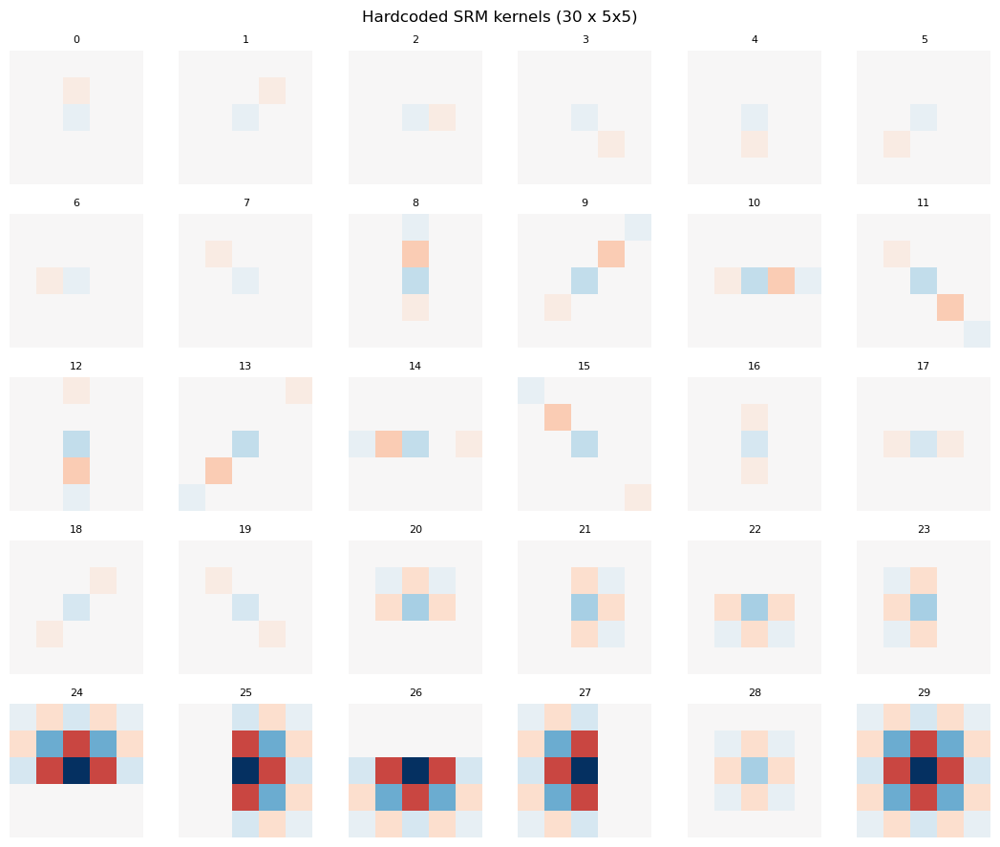

In [4]:
def plot_kernels(weight, title, cols=6):
    """weight: [N, 1, 5, 5] — plot N kernels as a grid of heatmaps."""
    w = weight.detach().cpu().squeeze(1).numpy()
    n = len(w)
    rows = (n + cols - 1) // cols
    fig, axes = plt.subplots(rows, cols, figsize=(cols * 1.8, rows * 1.8))
    axes = np.array(axes).reshape(rows, cols)
    vmax = max(np.abs(w).max(), 1e-6)
    for i in range(rows * cols):
        ax = axes[i // cols, i % cols]
        if i < n:
            ax.imshow(w[i], cmap="RdBu_r", vmin=-vmax, vmax=vmax)
            ax.set_title(f"{i}", fontsize=8)
        ax.axis("off")
    fig.suptitle(title)
    plt.tight_layout()
    plt.show()

plot_kernels(fixed_filters.kernels, "Hardcoded SRM kernels (30 x 5x5)")

## 2. Activation Maps on Sample Images

Pass a real and a fake image through the 30 SRM filter bank and visualize a selection of residual maps. What you're looking for: the *difference* in filter responses between real and fake - that's the signal the downstream classifier is learning to use.

If you don't have the dataset downloaded, the next cell falls back to a pair of synthetic patterns so the pipeline still demonstrates something.

In [5]:
def load_sample_images(root="../data"):
    """Find one real and one fake image under AIGCDataset-style layout."""
    real_paths = glob.glob(os.path.join(root, "**", "0_real", "*.*"), recursive=True)
    fake_paths = glob.glob(os.path.join(root, "**", "1_fake", "*.*"), recursive=True)
    ok = (".jpg", ".jpeg", ".png")
    real_paths = [p for p in real_paths if p.lower().endswith(ok)]
    fake_paths = [p for p in fake_paths if p.lower().endswith(ok)]
    if not real_paths or not fake_paths:
        return None, None
    return real_paths[0], fake_paths[0]

def to_tensor(img, size=256):
    img = img.convert("RGB").resize((size, size), Image.Resampling.LANCZOS)
    arr = np.array(img).astype(np.float32) / 255.0
    return torch.from_numpy(arr.transpose(2, 0, 1)).unsqueeze(0)

real_p, fake_p = load_sample_images("../data")
if real_p and fake_p:
    print(f"Real: {real_p}")
    print(f"Fake: {fake_p}")
    real_img = to_tensor(Image.open(real_p)).to(DEVICE)
    fake_img = to_tensor(Image.open(fake_p)).to(DEVICE)
else:
    print("No dataset found - using synthetic patterns.")
    y, x = np.mgrid[0:256, 0:256] / 256.0
    smooth = np.stack([y, x, y * x], 0).astype(np.float32)
    noisy = smooth + np.random.RandomState(0).randn(*smooth.shape).astype(np.float32) * 0.05
    real_img = torch.from_numpy(smooth).unsqueeze(0).to(DEVICE)
    fake_img = torch.from_numpy(noisy.clip(0, 1)).unsqueeze(0).to(DEVICE)

No dataset found - using synthetic patterns.


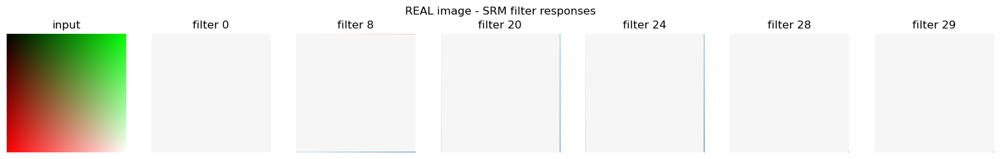

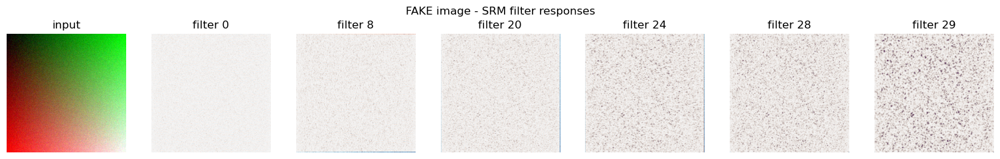

In [6]:
@torch.no_grad()
def show_activations(img, bank, title, filter_ids=(0, 8, 20, 24, 28, 29)):
    res = bank(img).cpu().squeeze(0).numpy()  # [30, H, W]
    fig, axes = plt.subplots(1, len(filter_ids) + 1, figsize=(2.2 * (len(filter_ids) + 1), 2.4))
    axes[0].imshow(img.cpu().squeeze(0).permute(1, 2, 0).numpy().clip(0, 1))
    axes[0].set_title("input"); axes[0].axis("off")
    for ax, fid in zip(axes[1:], filter_ids):
        m = res[fid]
        v = max(np.abs(m).max(), 1e-6)
        ax.imshow(m, cmap="RdBu_r", vmin=-v, vmax=v)
        ax.set_title(f"filter {fid}"); ax.axis("off")
    fig.suptitle(title); plt.tight_layout(); plt.show()

show_activations(real_img, fixed_filters, "REAL image - SRM filter responses")
show_activations(fake_img, fixed_filters, "FAKE image - SRM filter responses")

## 3. Which Filters Discriminate Real vs. Fake?

Measure the mean-absolute response per SRM filter on a batch of real images vs. a batch of fake images. The filters with the biggest *gap* between the two means are the ones most likely to carry useful class information to the classifier.

Uses up to 32 real and 32 fake images if available, else synthetic noise.

No dataset batches - generating synthetic.


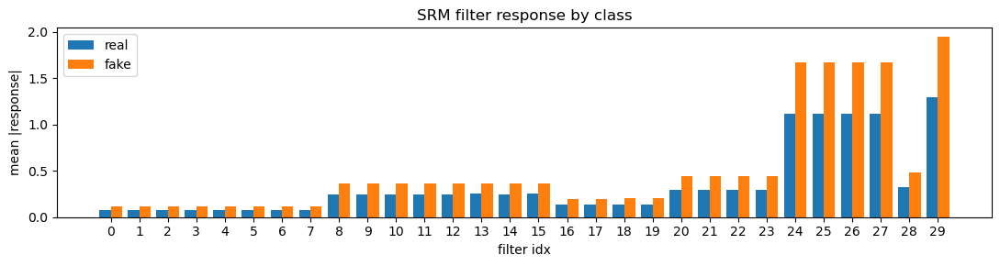

Top-5 discriminative SRM filters (|real - fake|): [29, 25, 27, 24, 26]


In [7]:
@torch.no_grad()
def mean_abs_response(imgs, bank):
    out = bank(imgs)  # [B, 30, H, W]
    return out.abs().mean(dim=(0, 2, 3)).cpu().numpy()  # [30]

def load_batch(pattern, root="../data", limit=32):
    ok = (".jpg", ".jpeg", ".png")
    paths = [p for p in glob.glob(os.path.join(root, "**", pattern, "*.*"), recursive=True)
             if p.lower().endswith(ok)][:limit]
    if not paths:
        return None
    return torch.cat([to_tensor(Image.open(p)) for p in paths]).to(DEVICE)

real_batch = load_batch("0_real")
fake_batch = load_batch("1_fake")

if real_batch is None or fake_batch is None:
    print("No dataset batches - generating synthetic.")
    real_batch = (torch.randn(8, 3, 256, 256, device=DEVICE) * 0.1 + 0.5).clamp(0, 1)
    fake_batch = (torch.randn(8, 3, 256, 256, device=DEVICE) * 0.15 + 0.5).clamp(0, 1)

r_resp = mean_abs_response(real_batch, fixed_filters)
f_resp = mean_abs_response(fake_batch, fixed_filters)
gap = np.abs(f_resp - r_resp)

fig, ax = plt.subplots(figsize=(11, 3))
x = np.arange(30)
ax.bar(x - 0.2, r_resp, 0.4, label="real")
ax.bar(x + 0.2, f_resp, 0.4, label="fake")
ax.set_xticks(x); ax.set_xlabel("filter idx"); ax.set_ylabel("mean |response|")
ax.set_title("SRM filter response by class")
ax.legend(); plt.tight_layout(); plt.show()

top = np.argsort(-gap)[:5]
print(f"Top-5 discriminative SRM filters (|real - fake|): {top.tolist()}")

## 4. Classifier Attention: Which Inputs Does Each Mode Rely On?

Each trained `PatchCraftClassifier` starts with a Conv2d layer that sees all input channels and learns which ones matter. The L2 norm of the weights connecting each input channel to all 32 output channels is a rough "attention weight" - bigger means the classifier relies on that channel more.

The three ablation modes have different input layouts:
- **`image_only`**: 3 channels - raw RGB (the "vanilla" CNN baseline)
- **`fingerprint_only`**: 30 channels - SRM residuals (per-channel attention maps 1:1 onto SRM filter indices)
- **`hybrid`**: 33 channels - channels 0-2 are RGB, channels 3-32 are SRM residuals

image_only: loaded epoch_20.pth — first conv (32, 3, 3, 3)
fingerprint_only: loaded epoch_20.pth — first conv (32, 30, 3, 3)
hybrid: loaded epoch_20.pth — first conv (32, 33, 3, 3)
  image_only top-5 channels: [1, 2, 0]


C:\Users\jerem\AppData\Local\Temp\ipykernel_3900\1801367826.py:39: FutureWarning: You are using `torch.load` with `weights_only=False` (the current default value), which uses the default pickle module implicitly. It is possible to construct malicious pickle data which will execute arbitrary code during unpickling (See https://github.com/pytorch/pytorch/blob/main/SECURITY.md#untrusted-models for more details). In a future release, the default value for `weights_only` will be flipped to `True`. This limits the functions that could be executed during unpickling. Arbitrary objects will no longer be allowed to be loaded via this mode unless they are explicitly allowlisted by the user via `torch.serialization.add_safe_globals`. We recommend you start setting `weights_only=True` for any use case where you don't have full control of the loaded file. Please open an issue on GitHub for any issues related to this experimental feature.
  model.load_state_dict(torch.load(ckpt, map_location=DEVICE))

  fingerprint_only top-5 channels: [2, 22, 17, 21, 19]
  hybrid top-5 channels: [28, 10, 15, 30, 25]


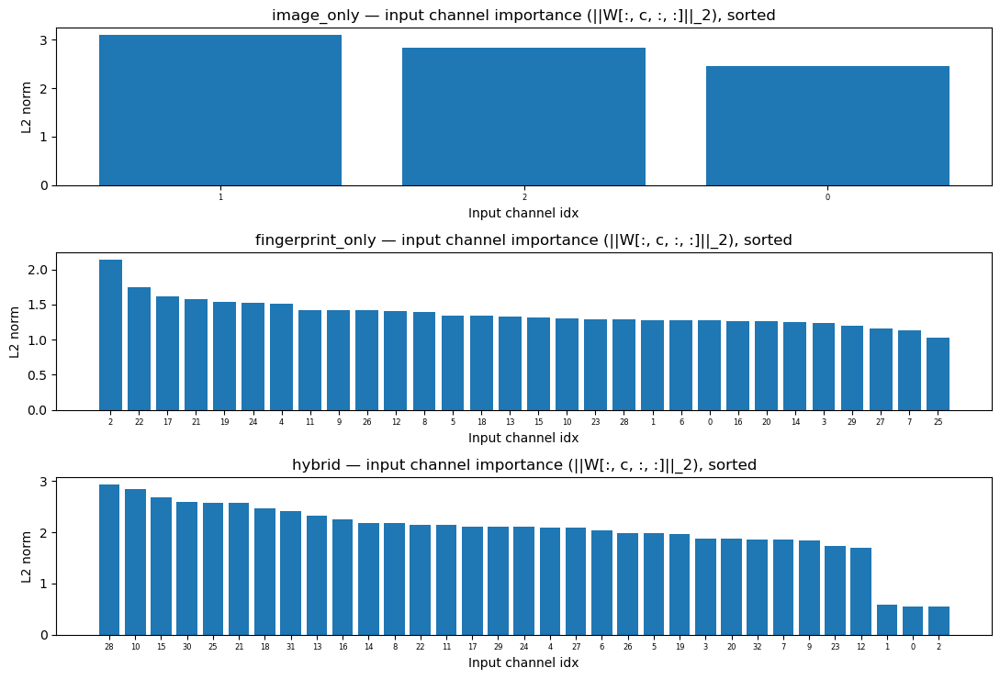

In [8]:
class ConvBNReLU(nn.Module):
    def __init__(self, in_c, out_c, k=3, s=1, p=1):
        super().__init__()
        self.block = nn.Sequential(
            nn.Conv2d(in_c, out_c, k, s, p, bias=False),
            nn.BatchNorm2d(out_c),
            nn.ReLU(inplace=True),
        )
    def forward(self, x): return self.block(x)


class PatchCraftClassifier(nn.Module):
    def __init__(self, in_channels=30, feat=32, num_classes=1):
        super().__init__()
        self.features = nn.Sequential(
            ConvBNReLU(in_channels, feat),
            ConvBNReLU(feat, feat), ConvBNReLU(feat, feat), ConvBNReLU(feat, feat),
            nn.AvgPool2d(2, 2),
            ConvBNReLU(feat, feat), ConvBNReLU(feat, feat),
            nn.AvgPool2d(2, 2),
            ConvBNReLU(feat, feat), ConvBNReLU(feat, feat),
            nn.AvgPool2d(2, 2),
            ConvBNReLU(feat, feat), ConvBNReLU(feat, feat),
            nn.AdaptiveAvgPool2d((1, 1)),
        )
        self.classifier = nn.Linear(feat, num_classes)

    def forward(self, x):
        x = self.features(x); x = torch.flatten(x, 1); return self.classifier(x).squeeze(1)


def load_classifier(mode, epoch=-1):
    """Load the PatchCraftClassifier checkpoint for `mode` at the given epoch (default: last)."""
    if mode not in CHECKPOINTS:
        raise FileNotFoundError(f"No checkpoints for mode {mode!r}")
    ckpt = CHECKPOINTS[mode][epoch]
    in_c = MODE_IN_CHANNELS[mode]
    model = PatchCraftClassifier(in_channels=in_c).to(DEVICE)
    model.load_state_dict(torch.load(ckpt, map_location=DEVICE))
    model.eval()
    return model, ckpt


def input_channel_importance(model):
    """L2 norm of first-conv weights per input channel."""
    w = model.features[0].block[0].weight.detach().cpu()   # [out, in, kH, kW]
    return w.pow(2).sum(dim=(0, 2, 3)).sqrt().numpy()      # [in]


# Load last-epoch classifiers for every mode we have
classifiers = {}
importances = {}
for mode in CHECKPOINTS:
    model, ckpt = load_classifier(mode)
    classifiers[mode] = model
    importances[mode] = input_channel_importance(model)
    print(f"{mode}: loaded {ckpt.name} — first conv {tuple(model.features[0].block[0].weight.shape)}")


# Per-mode bar charts of input importance
fig, axes = plt.subplots(len(importances), 1, figsize=(11, 2.5 * len(importances)))
if len(importances) == 1:
    axes = [axes]
for ax, (mode, imp) in zip(axes, importances.items()):
    order = np.argsort(-imp)
    ax.bar(range(len(imp)), imp[order])
    ax.set_xticks(range(len(imp)))
    ax.set_xticklabels(order, fontsize=6)
    ax.set_title(f"{mode} — input channel importance (||W[:, c, :, :]||_2), sorted")
    ax.set_xlabel("Input channel idx")
    ax.set_ylabel("L2 norm")
    top = order[:5].tolist()
    print(f"  {mode} top-5 channels: {top}")
plt.tight_layout(); plt.show()

## 5. Cross-Mode: Do `fingerprint_only` and `hybrid` Attend to the Same SRM Filters?

Both modes see the 30 SRM residual channels. If they agree on which filters are important, that's evidence the SRM bank has a stable "useful subset." If they disagree, the hybrid model may be offloading some work onto the raw RGB channels.

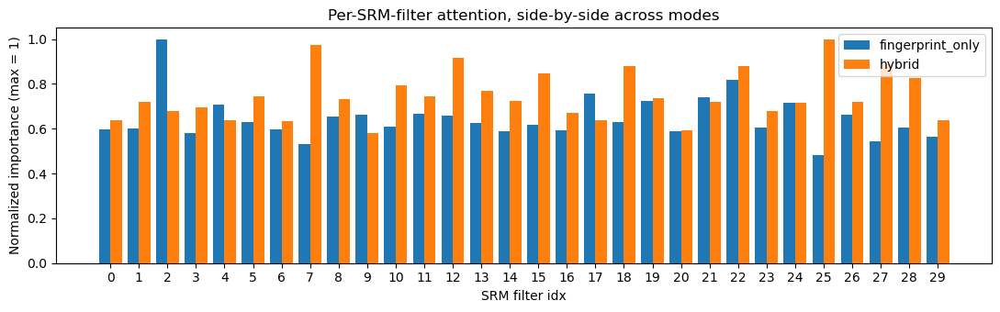

Spearman rank correlation (fingerprint_only vs hybrid SRM attention): rho=-0.117, p=5.39e-01
  fingerprint_only top-5: [np.int64(2), np.int64(17), np.int64(19), np.int64(21), np.int64(22)]
  hybrid top-5:           [np.int64(7), np.int64(12), np.int64(22), np.int64(25), np.int64(27)]
  overlap:                [np.int64(22)]

Hybrid: 2.5% of first-layer attention goes to RGB, 97.5% to SRM residuals.


In [9]:
# Extract the SRM-channel slice from each mode's importance vector:
#   fingerprint_only: all 30 channels are SRM
#   hybrid: channels 3..32 are SRM (channels 0..2 are RGB)
srm_att = {}
if "fingerprint_only" in importances:
    srm_att["fingerprint_only"] = importances["fingerprint_only"]
if "hybrid" in importances:
    srm_att["hybrid"] = importances["hybrid"][3:]  # drop RGB channels, keep the 30 SRM

if len(srm_att) >= 2:
    fig, ax = plt.subplots(figsize=(11, 3.5))
    x = np.arange(30)
    width = 0.8 / len(srm_att)
    for i, (mode, imp) in enumerate(srm_att.items()):
        # normalize so the two curves are comparable in magnitude
        ax.bar(x + (i - (len(srm_att) - 1) / 2) * width, imp / imp.max(),
               width=width, label=mode)
    ax.set_xticks(x); ax.set_xlabel("SRM filter idx")
    ax.set_ylabel("Normalized importance (max = 1)")
    ax.set_title("Per-SRM-filter attention, side-by-side across modes")
    ax.legend(); plt.tight_layout(); plt.show()

    # Rank agreement: Spearman's correlation between the two orderings
    from scipy.stats import spearmanr
    (rho, p) = spearmanr(srm_att["fingerprint_only"], srm_att["hybrid"])
    print(f"Spearman rank correlation (fingerprint_only vs hybrid SRM attention): "
          f"rho={rho:.3f}, p={p:.2e}")

    # Top-5 intersection
    top_fp = set(np.argsort(-srm_att["fingerprint_only"])[:5])
    top_hy = set(np.argsort(-srm_att["hybrid"])[:5])
    print(f"  fingerprint_only top-5: {sorted(top_fp)}")
    print(f"  hybrid top-5:           {sorted(top_hy)}")
    print(f"  overlap:                {sorted(top_fp & top_hy)}")

    # For hybrid, how much attention went to RGB vs SRM in total?
    if "hybrid" in importances:
        hy = importances["hybrid"]
        rgb_share = hy[:3].sum() / hy.sum()
        print(f"\nHybrid: {rgb_share:.1%} of first-layer attention goes to RGB, "
              f"{1 - rgb_share:.1%} to SRM residuals.")
else:
    print("Need both fingerprint_only and hybrid checkpoints for cross-mode comparison.")

## 6. Epoch Evolution: How Does Attention Develop During Training?

Watching which input channels a mode attends to across epochs tells us whether the attention pattern emerges early or takes the whole training run to stabilize. For `fingerprint_only` and `hybrid`, we render a heatmap of (epoch x SRM channel) importance.

C:\Users\jerem\AppData\Local\Temp\ipykernel_3900\2838147893.py:8: FutureWarning: You are using `torch.load` with `weights_only=False` (the current default value), which uses the default pickle module implicitly. It is possible to construct malicious pickle data which will execute arbitrary code during unpickling (See https://github.com/pytorch/pytorch/blob/main/SECURITY.md#untrusted-models for more details). In a future release, the default value for `weights_only` will be flipped to `True`. This limits the functions that could be executed during unpickling. Arbitrary objects will no longer be allowed to be loaded via this mode unless they are explicitly allowlisted by the user via `torch.serialization.add_safe_globals`. We recommend you start setting `weights_only=True` for any use case where you don't have full control of the loaded file. Please open an issue on GitHub for any issues related to this experimental feature.
  m.load_state_dict(torch.load(p, map_location="cpu"))


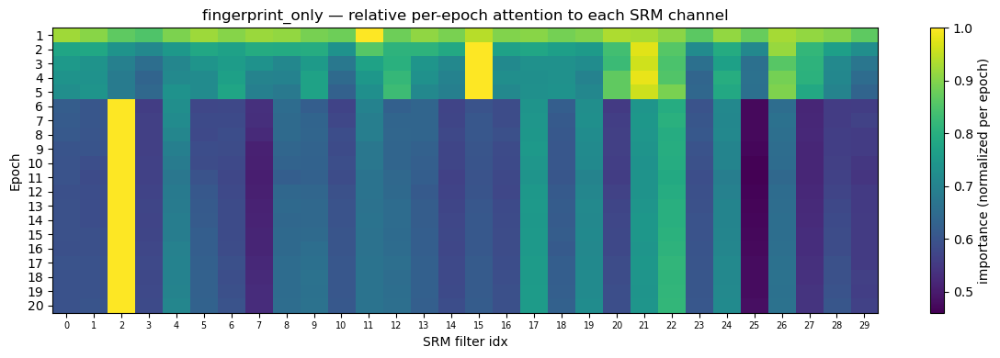

fingerprint_only: SRM channels the model leaned INTO from early->late: [2, 22, 17, 19, 4]
fingerprint_only: SRM channels the model leaned AWAY from early->late:  [25, 27, 7, 15, 20]


C:\Users\jerem\AppData\Local\Temp\ipykernel_3900\2838147893.py:8: FutureWarning: You are using `torch.load` with `weights_only=False` (the current default value), which uses the default pickle module implicitly. It is possible to construct malicious pickle data which will execute arbitrary code during unpickling (See https://github.com/pytorch/pytorch/blob/main/SECURITY.md#untrusted-models for more details). In a future release, the default value for `weights_only` will be flipped to `True`. This limits the functions that could be executed during unpickling. Arbitrary objects will no longer be allowed to be loaded via this mode unless they are explicitly allowlisted by the user via `torch.serialization.add_safe_globals`. We recommend you start setting `weights_only=True` for any use case where you don't have full control of the loaded file. Please open an issue on GitHub for any issues related to this experimental feature.
  m.load_state_dict(torch.load(p, map_location="cpu"))


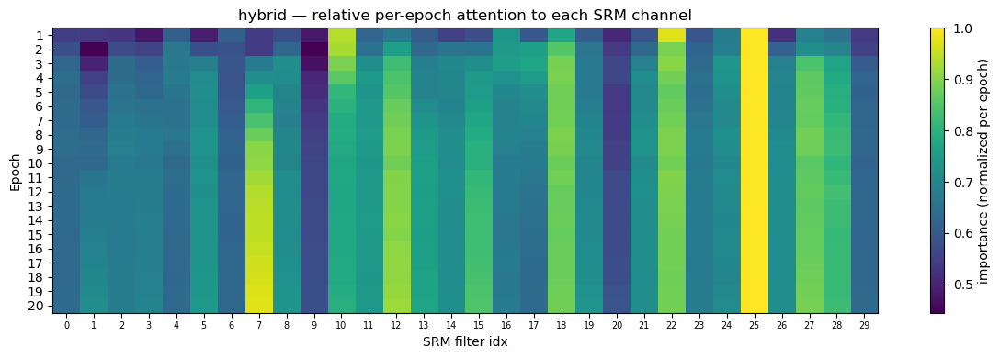

hybrid: SRM channels the model leaned INTO from early->late: [7, 12, 15, 27, 1]
hybrid: SRM channels the model leaned AWAY from early->late:  [17, 16, 10, 4, 20]


In [10]:
def importance_over_epochs(mode):
    """Return array of shape [num_epochs, num_input_channels] with per-epoch importances."""
    eps = CHECKPOINTS[mode]
    in_c = MODE_IN_CHANNELS[mode]
    rows = []
    for p in eps:
        m = PatchCraftClassifier(in_channels=in_c)
        m.load_state_dict(torch.load(p, map_location="cpu"))
        rows.append(input_channel_importance(m))
    return np.stack(rows), [int(p.stem.split("_")[1]) for p in eps]


for mode in [m for m in ("fingerprint_only", "hybrid") if m in CHECKPOINTS]:
    mat, epoch_nums = importance_over_epochs(mode)
    # For hybrid, drop RGB rows so all 30 columns are SRM
    if mode == "hybrid":
        mat = mat[:, 3:]
    # normalize each row so the heatmap shows relative attention within that epoch
    mat_norm = mat / mat.max(axis=1, keepdims=True)

    fig, ax = plt.subplots(figsize=(12, 4))
    im = ax.imshow(mat_norm, aspect="auto", cmap="viridis")
    ax.set_yticks(range(len(epoch_nums)))
    ax.set_yticklabels(epoch_nums)
    ax.set_xticks(range(30))
    ax.set_xticklabels(range(30), fontsize=7)
    ax.set_xlabel("SRM filter idx")
    ax.set_ylabel("Epoch")
    ax.set_title(f"{mode} — relative per-epoch attention to each SRM channel")
    plt.colorbar(im, ax=ax, label="importance (normalized per epoch)")
    plt.tight_layout(); plt.show()

    # Summary: early vs late attention
    early = mat[:3].mean(axis=0)
    late = mat[-3:].mean(axis=0)
    shift = late / early.max() - early / early.max()
    gained = np.argsort(-shift)[:5]
    lost = np.argsort(shift)[:5]
    print(f"{mode}: SRM channels the model leaned INTO from early->late: {gained.tolist()}")
    print(f"{mode}: SRM channels the model leaned AWAY from early->late:  {lost.tolist()}")

## 7. Layer-by-Layer Activations (all three modes)

Register forward hooks on each stage of the classifier and run sample images through each of the three trained modes. For every stage (each `ConvBNReLU` block and each pool), we render a grid showing the top-most-activated channels. You can watch the representation become more abstract and lower-resolution as the input flows deeper.

**Caveats:**
- For `image_only` the pipeline is direct: raw RGB -> classifier.
- For `fingerprint_only` and `hybrid`, the *real* pipeline in `notebook.ipynb` first passes the image through a smash/reconstruct + learnable extractor that wasn't saved in the classifier checkpoints. To still visualize something meaningful, we feed the SRM residuals (fingerprint_only) or RGB+residuals (hybrid) directly to the classifier. Activation patterns will differ from production inference but still show what each layer does with this kind of input.


=== Visualizing layer activations: mode = image_only ===


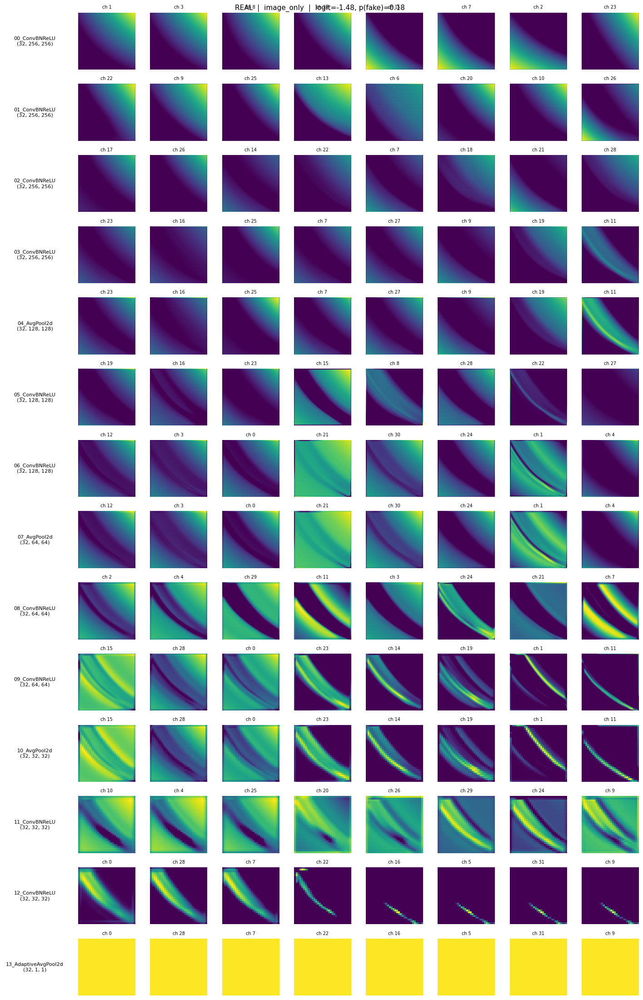

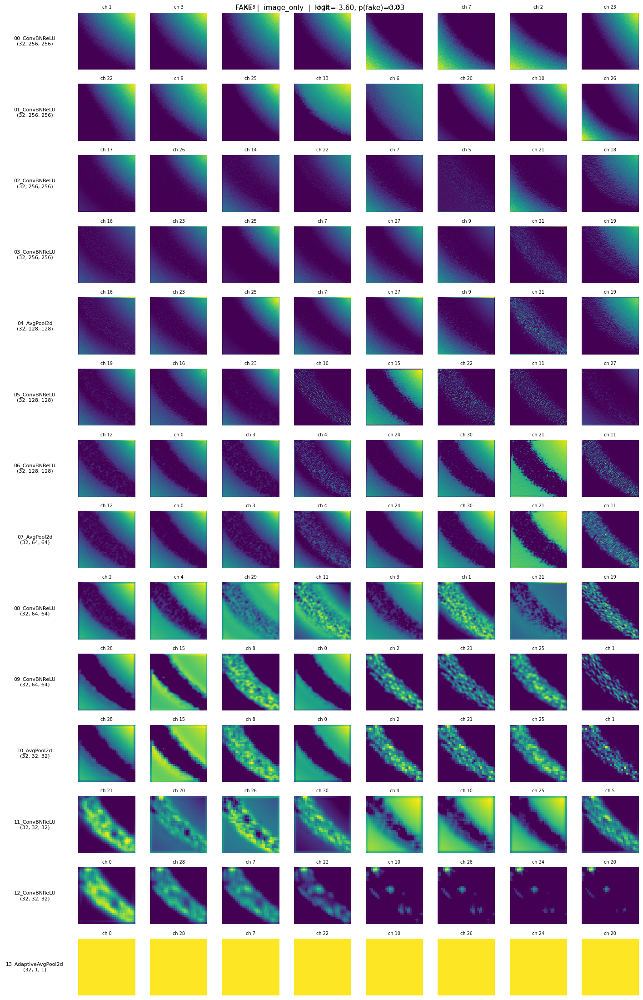


=== Visualizing layer activations: mode = fingerprint_only ===


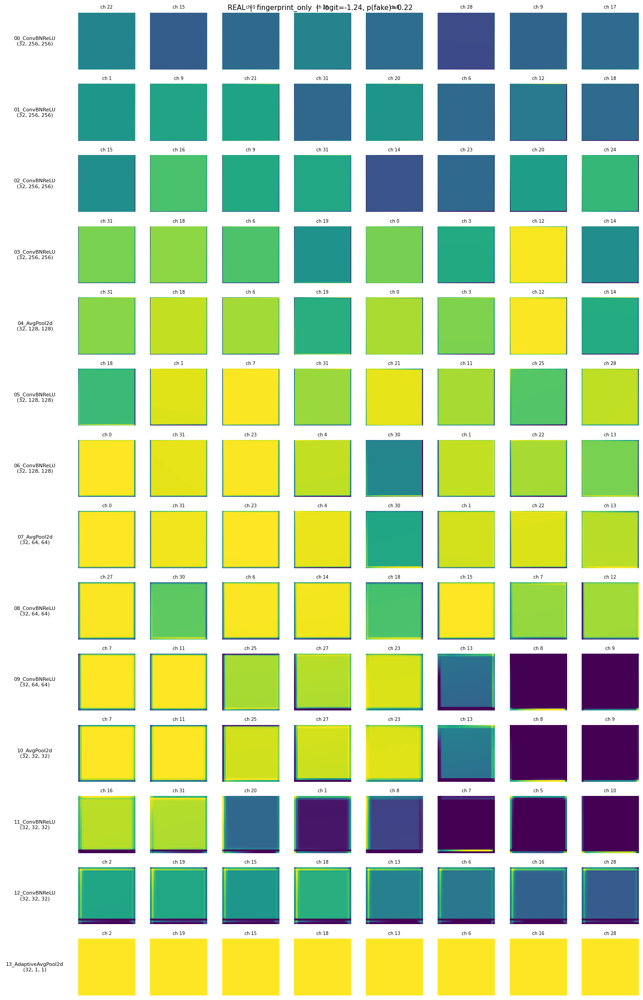

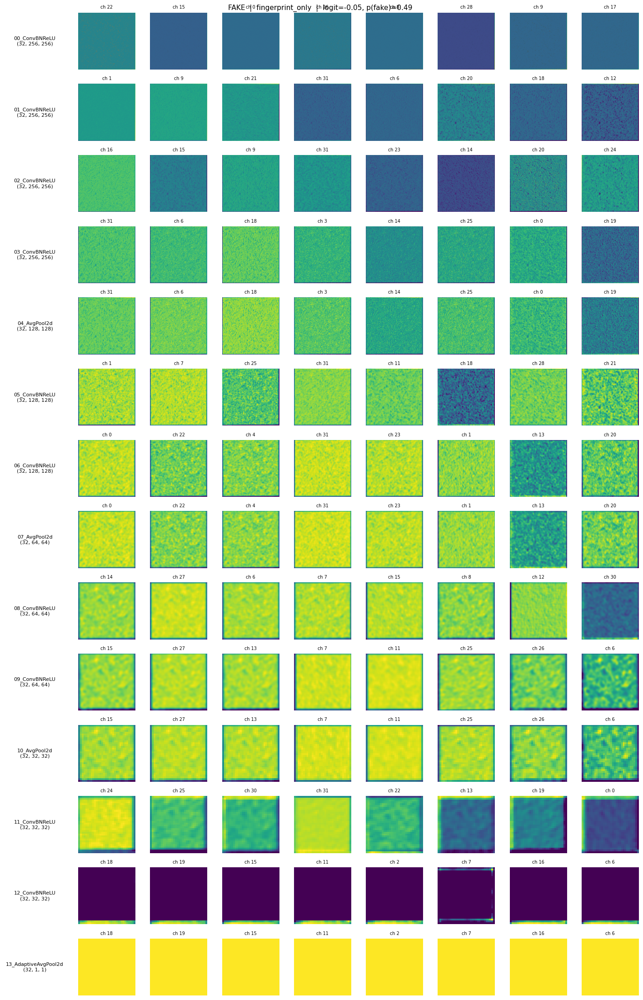


=== Visualizing layer activations: mode = hybrid ===


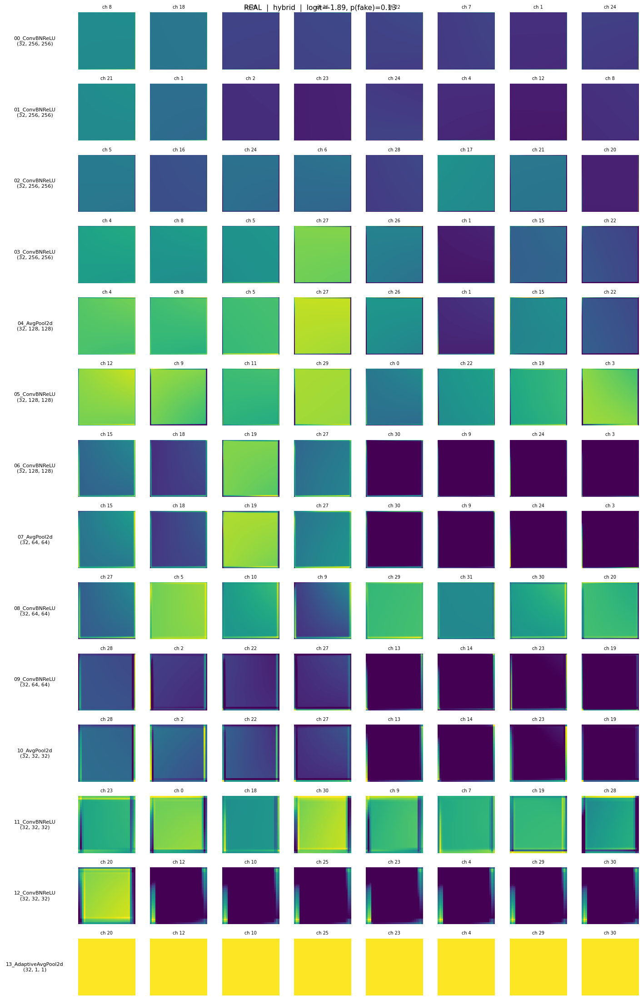

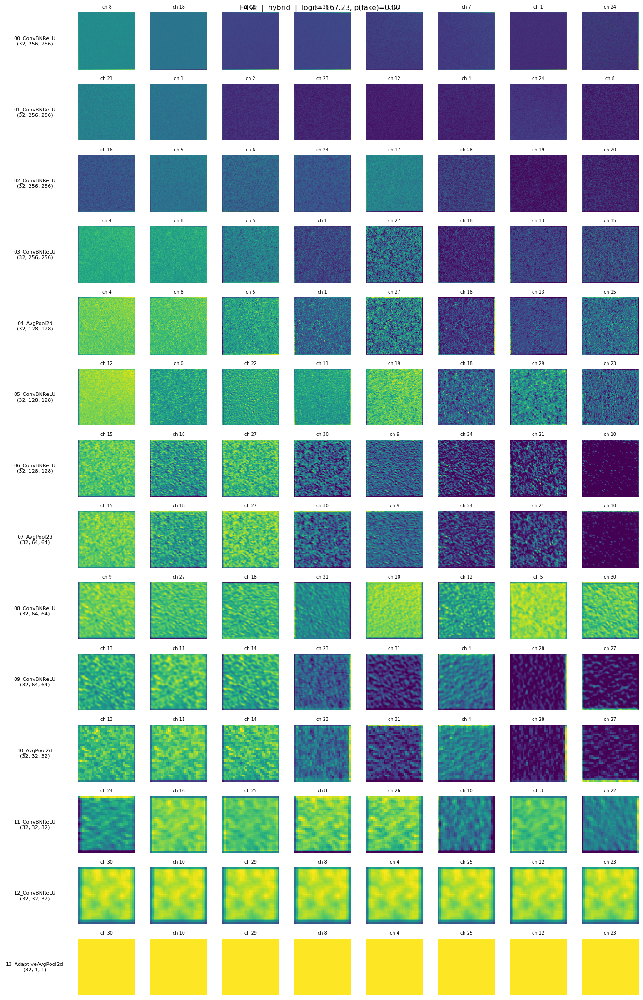

In [11]:
def prepare_input(img_rgb, mode):
    """img_rgb: [1, 3, H, W] in [0, 1]. Returns tensor shaped as classifier expects."""
    if mode == "image_only":
        return img_rgb
    residuals = fixed_filters(img_rgb)   # [1, 30, H, W]
    if mode == "fingerprint_only":
        return residuals
    if mode == "hybrid":
        return torch.cat([img_rgb, residuals], dim=1)
    raise ValueError(mode)


def forward_with_activations(model, x):
    """Run a forward pass while capturing every child output of model.features."""
    acts = {}
    hooks = []
    for i, mod in enumerate(model.features):
        name = f"{i:02d}_{type(mod).__name__}"
        hooks.append(mod.register_forward_hook(
            lambda m, inp, out, n=name: acts.__setitem__(n, out.detach().cpu())
        ))
    try:
        with torch.no_grad():
            logit = model(x)
    finally:
        for h in hooks:
            h.remove()
    return acts, logit.item()


def plot_activation_grid(acts, k_channels=8, title=""):
    layers = list(acts.items())
    fig, axes = plt.subplots(len(layers), k_channels + 1,
                             figsize=((k_channels + 1) * 1.6, len(layers) * 1.6))
    if len(layers) == 1:
        axes = axes[None, :]
    for row, (name, a) in enumerate(layers):
        a = a[0]
        importance = a.abs().mean(dim=(1, 2))
        top = torch.argsort(importance, descending=True)[:k_channels]
        axes[row, 0].text(0.5, 0.5, f"{name}\n{tuple(a.shape)}",
                          ha="center", va="center", fontsize=8,
                          transform=axes[row, 0].transAxes)
        axes[row, 0].axis("off")
        for col, ch in enumerate(top, start=1):
            m = a[ch].numpy()
            v = max(abs(m.min()), abs(m.max()), 1e-6)
            axes[row, col].imshow(m, cmap="viridis", vmin=0, vmax=v)
            axes[row, col].set_title(f"ch {int(ch)}", fontsize=7)
            axes[row, col].axis("off")
        for col in range(len(top) + 1, k_channels + 1):
            axes[row, col].axis("off")
    fig.suptitle(title, fontsize=11)
    plt.tight_layout(); plt.show()


# Visualize every trained mode: image_only (vanilla CNN), fingerprint_only, hybrid
for mode in classifiers:
    model = classifiers[mode]
    print(f"\n=== Visualizing layer activations: mode = {mode} ===")
    for label, img in [("REAL", real_img), ("FAKE", fake_img)]:
        x = prepare_input(img, mode).to(DEVICE)
        acts, logit = forward_with_activations(model, x)
        prob = torch.sigmoid(torch.tensor(logit)).item()
        plot_activation_grid(acts, k_channels=8,
                             title=f"{label}  |  {mode}  |  logit={logit:.2f}, p(fake)={prob:.2f}")

## 8. Grad-CAM: What Regions Drive the Prediction?

Grad-CAM computes a spatial heatmap of "where the model is looking" when making its decision. We hook into the **last conv layer** of the classifier, backpropagate from the output logit, and weight each channel's activation map by its mean gradient. The result overlays on the input image - bright regions are what pushed the model toward the "fake" decision.

This works for all three modes (including `image_only`, the vanilla-CNN baseline).

c:\Users\jerem\miniconda3\envs\device_connectivity\Lib\site-packages\torch\autograd\graph.py:825: UserWarning: Attempting to run cuBLAS, but there was no current CUDA context! Attempting to set the primary context... (Triggered internally at C:\cb\pytorch_1000000000000\work\aten\src\ATen\cuda\CublasHandlePool.cpp:135.)
  return Variable._execution_engine.run_backward(  # Calls into the C++ engine to run the backward pass


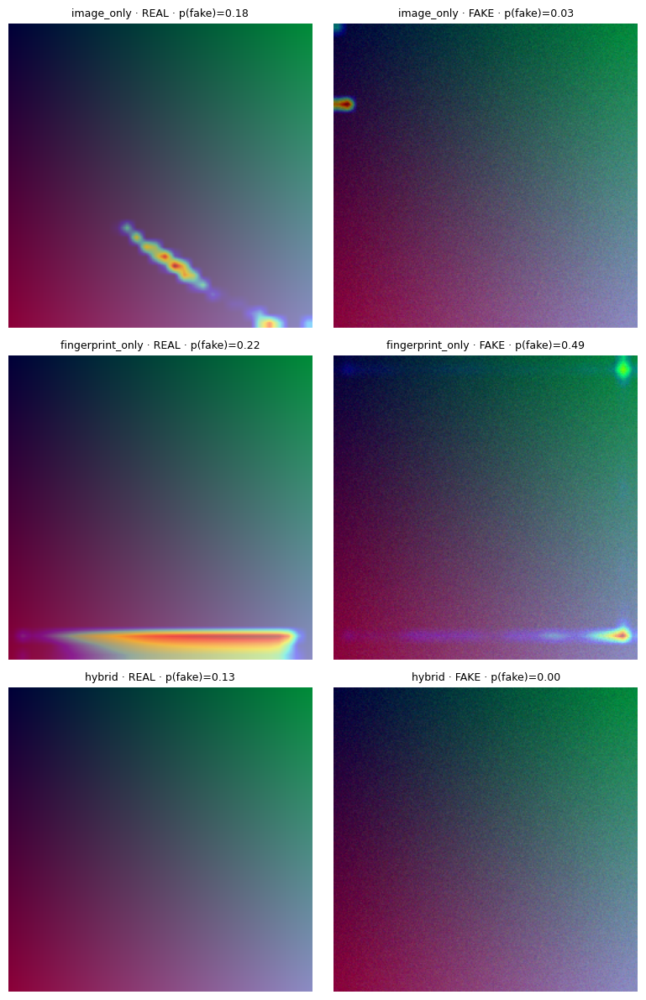

In [12]:
import torch.nn.functional as F


def find_last_conv_block(model):
    """Return the last ConvBNReLU block in model.features (before AdaptiveAvgPool)."""
    last = None
    for mod in model.features:
        if isinstance(mod, ConvBNReLU):
            last = mod
    return last


def grad_cam(model, x):
    """Compute Grad-CAM heatmap for the scalar logit at input x. Returns [H, W] in [0,1]."""
    target = find_last_conv_block(model)
    acts_out, grads_out = [], []
    fh = target.register_forward_hook(lambda m, inp, out: acts_out.append(out))
    bh = target.register_full_backward_hook(lambda m, gi, go: grads_out.append(go[0]))

    model.zero_grad()
    # Need gradients w.r.t. activations — make sure input is a leaf that doesn't block grads
    x = x.detach().clone().requires_grad_(False)
    logit = model(x)               # [1]
    logit.sum().backward()         # grad is scalar-to-activations path

    a = acts_out[0][0]              # [C, H, W]
    g = grads_out[0][0]             # [C, H, W]
    weights = g.mean(dim=(1, 2))    # [C]
    cam = torch.relu((a * weights[:, None, None]).sum(dim=0))   # [H, W]

    fh.remove(); bh.remove()

    cam = cam.detach().cpu().float()
    cam -= cam.min()
    if cam.max() > 0:
        cam /= cam.max()
    # Upscale to input resolution for overlay
    H, W = x.shape[-2:]
    cam = F.interpolate(cam[None, None], size=(H, W), mode="bilinear", align_corners=False)
    return cam[0, 0].numpy(), logit.item()


def overlay_cam(img_rgb, cam, ax, title=""):
    img_np = img_rgb[0].detach().cpu().permute(1, 2, 0).numpy().clip(0, 1)
    ax.imshow(img_np)
    ax.imshow(cam, cmap="jet", alpha=0.45)
    ax.set_title(title, fontsize=9)
    ax.axis("off")


# Grad-CAM for every available mode, on real and fake images
fig, axes = plt.subplots(len(classifiers), 2, figsize=(8, 4 * len(classifiers)))
if len(classifiers) == 1:
    axes = axes[None, :]
for row, (mode, model) in enumerate(classifiers.items()):
    for col, (label, img) in enumerate([("REAL", real_img), ("FAKE", fake_img)]):
        x = prepare_input(img, mode).to(DEVICE)
        cam, logit = grad_cam(model, x)
        prob = torch.sigmoid(torch.tensor(logit)).item()
        overlay_cam(img, cam, axes[row, col],
                    title=f"{mode} · {label} · p(fake)={prob:.2f}")
plt.tight_layout(); plt.show()